In [11]:
import cv2
import os
import numpy as np
from matplotlib import pyplot as plt
from skimage.metrics import structural_similarity as ssim
from concurrent.futures import ThreadPoolExecutor

#sift = cv2.SIFT_create()
bf = cv2.BFMatcher()

def get_homography_information(img):
    sift = cv2.SIFT_create()
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    snow_mask = cv2.inRange(gray, 180, 255)
    snow_masked_image = img.copy()
    snow_masked_image[snow_mask > 0] = 0
    keypoints, descriptors = sift.detectAndCompute(snow_masked_image, None)
    return keypoints, descriptors



In [12]:
dirname = 'data'
out_dirname = 'output'
if not os.path.exists(out_dirname):
    os.makedirs(out_dirname)
# Chosen because it has good contrast, shows the whole area of interest and very few shadows
reference_image = 'arapahoA9_13.tif'
img_ref = cv2.imread(os.path.join(dirname, reference_image))
keypoints_ref, descriptors_ref = get_homography_information(img_ref)

def process_file(compare_image_filename):
    print(f"{compare_image_filename} start...")
    compare_image_filename_full = os.path.join(dirname, compare_image_filename)
    img_comp = cv2.imread(compare_image_filename_full)
    print(f"{compare_image_filename} getting homography information...")
    keypoints_comp, descriptors_comp = get_homography_information(img_comp)

    print(f"{compare_image_filename} matching descriptors...")
    matches = bf.knnMatch(descriptors_comp, descriptors_ref, k=2)

    # Apply Lowe’s ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    print(f"{compare_image_filename} ({len(good_matches)}) matches found...")


    src_pts = np.float32([keypoints_comp[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints_ref[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)


    print(f"{compare_image_filename} calculating homography...")
    reprojection_threshold = 5.0
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, reprojection_threshold)
    print(f"{compare_image_filename} warping perspective...")
    aligned_img = cv2.warpPerspective(img_comp, H, (img_ref.shape[1], img_ref.shape[0]))

    inlier_matches = [good_matches[i] for i in range(len(good_matches)) if mask[i]]

    if len(inlier_matches) < 10:
        print(f"{compare_image_filename} not enough inlier matches found ({len(inlier_matches)}), skipping...")
        return
    else:
        print(f"{compare_image_filename} {len(inlier_matches)} inlier matches found...")

    draw_matches = True
    if draw_matches:
        print(f"{compare_image_filename} drawing matches...")
        img_inliers_homography = cv2.drawMatches(
            img_comp, keypoints_comp,
            img_ref, keypoints_ref,
            inlier_matches, None,
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
        )
        image_path = os.path.join(out_dirname, f"{compare_image_filename}_homography_inlier_matches.png")
        plt.imsave(image_path, cv2.cvtColor(img_inliers_homography, cv2.COLOR_BGR2RGB))

    # Overlay aligned_img_homography and img2 with 50% opacity each
    # Save the aligned image with filename overlay using matplotlib
    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(aligned_img, cv2.COLOR_BGR2RGB))
    plt.title(compare_image_filename, fontsize=16, color='white', backgroundcolor='black', pad=20)
    plt.axis('off')
    out_path = os.path.join(out_dirname, f"{compare_image_filename}_aligned_homography.png")
    plt.savefig(f"{out_path}", bbox_inches='tight', pad_inches=0)
    plt.close()
    print(f"{compare_image_filename} done...")

files = [f for f in os.listdir(dirname) if not f.endswith('.txt') and f.startswith('arapaho')]
image_pairs = [(filename) for filename in files[0:3]]

with ThreadPoolExecutor(max_workers=10) as executor:
    results = list(executor.map(process_file, image_pairs))


#grayA = cv2.cvtColor(aligned_img_homography, cv2.COLOR_BGR2GRAY)
#grayB = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
#score, _ = ssim(grayA, grayB, full=True)
#print("SSIM:", score)


arapaho_waldrop_083.tif start...arapaho_waldrop_040.tif start...

arapaho1917000001.tif start...
arapaho_waldrop_083.tif getting homography information...
arapaho_waldrop_040.tif getting homography information...
arapaho1917000001.tif getting homography information...
arapaho_waldrop_083.tif matching descriptors...
arapaho_waldrop_040.tif matching descriptors...
arapaho1917000001.tif matching descriptors...
arapaho_waldrop_083.tif (1264) matches found...
arapaho_waldrop_083.tif calculating homography...
arapaho_waldrop_083.tif warping perspective...
arapaho_waldrop_083.tif 879 inlier matches found...
arapaho_waldrop_083.tif drawing matches...
arapaho_waldrop_083.tif done...
arapaho_waldrop_040.tif (220) matches found...
arapaho_waldrop_040.tif calculating homography...
arapaho_waldrop_040.tif warping perspective...
arapaho_waldrop_040.tif 11 inlier matches found...
arapaho_waldrop_040.tif drawing matches...
arapaho_waldrop_040.tif done...
arapaho1917000001.tif (385) matches found...
ar

In [12]:
import glob
from PIL import Image

# Find all files ending with "aligned_homography.png" in the current folder
image_files = sorted(glob.glob("output/*aligned_homography.png"))

# Load images
images = [Image.open(f) for f in image_files]

# Save as GIF
if images:
    images[0].save(
        "aligned_homography_animation.gif",
        save_all=True,
        append_images=images[1:],
        duration=1000,
        loop=0
    )
    print("GIF saved as aligned_homography_animation.gif")
else:
    print("No images found ending with 'aligned_homography.png'")

GIF saved as aligned_homography_animation.gif


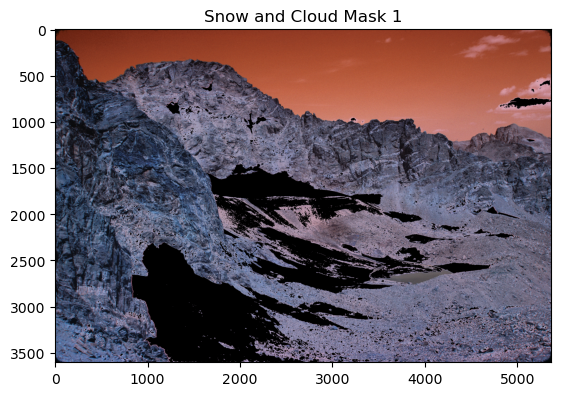

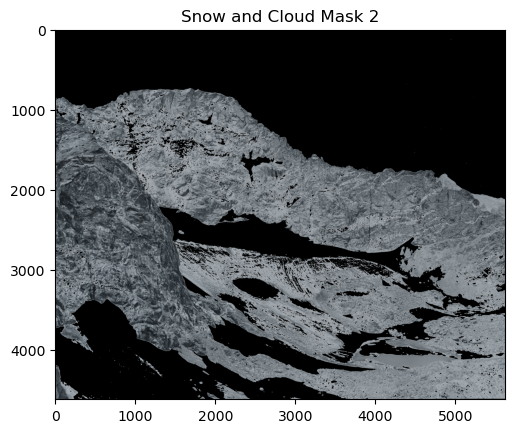

In [12]:
# Create a mask for snow in each image
snow_mask_1 = cv2.inRange(gray1, 180, 255)
snow_mask_2 = cv2.inRange(gray2, 180, 255)

# Set the values of image_1 and image_2 where there is snow to 0
snow_masked_image_2 = img2.copy()
snow_masked_image_2[snow_mask_2 > 0] = 0

snow_masked_image_1 = img1.copy()
snow_masked_image_1[snow_mask_1 > 0] = 0

# Display the snow masks
plt.imshow(snow_masked_image_1)
plt.title('Snow and Cloud Mask 1')
plt.show()

plt.imshow(snow_masked_image_2)
plt.title('Snow and Cloud Mask 2')
plt.show()

In [3]:
sift = cv2.SIFT_create()
keypoints1, descriptors1 = sift.detectAndCompute(gray1, None)
keypoints2, descriptors2 = sift.detectAndCompute(gray2, None)

Detect and draw feature matches

In [4]:
bf = cv2.BFMatcher()
matches = bf.knnMatch(descriptors1, descriptors2, k=2)

# Apply Lowe’s ratio test
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

In [5]:
src_pts = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)


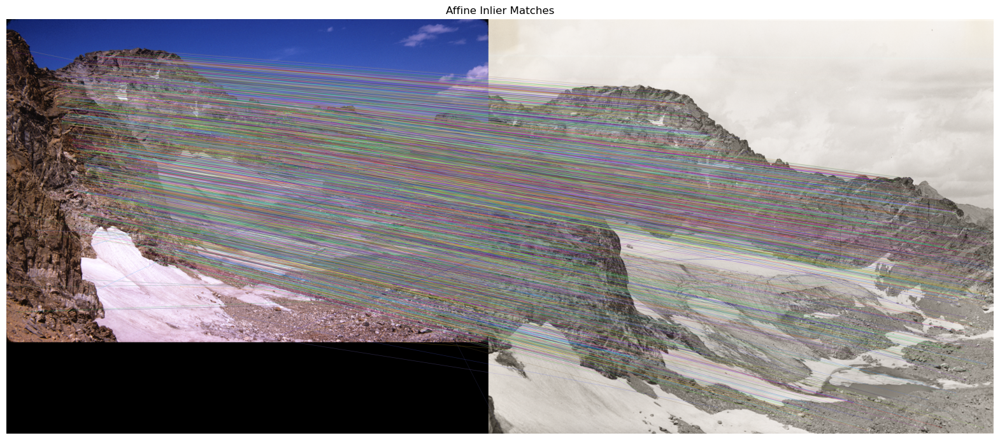

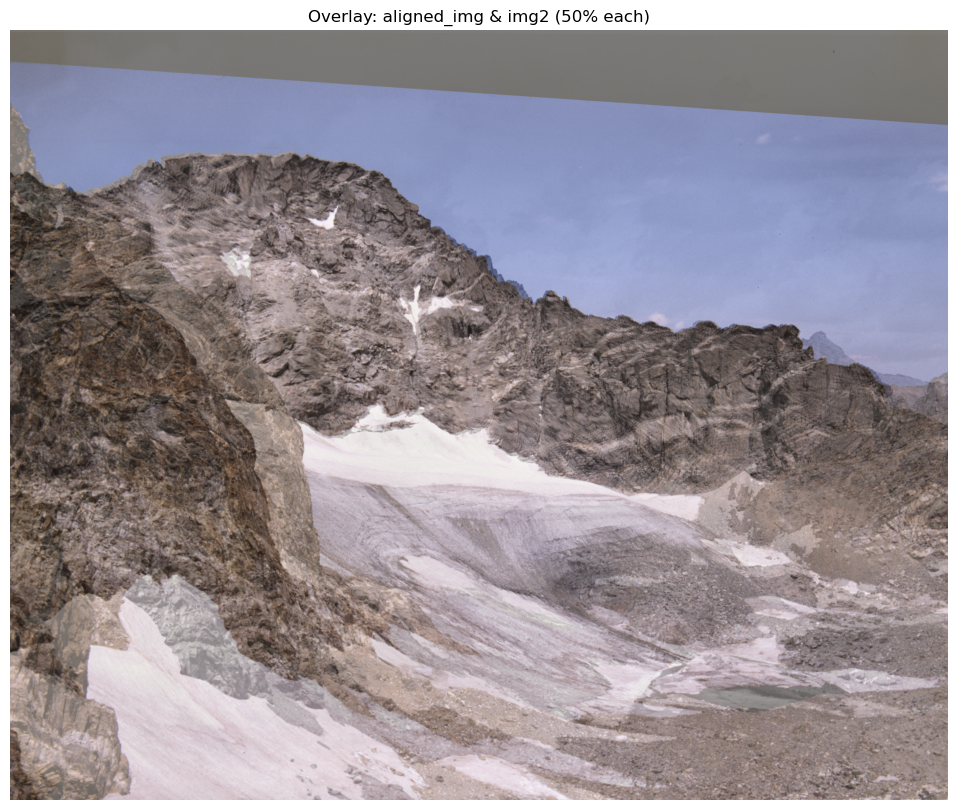

SSIM: 0.3715310703816862


In [10]:
# Affine alignment visualization

M, inliers_affine = cv2.estimateAffine2D(src_pts, dst_pts, method=cv2.RANSAC, ransacReprojThreshold=5.0)
aligned_img_affine = cv2.warpAffine(img1, M, (img2.shape[1], img2.shape[0]))

img_inliers_affine = cv2.drawMatches(
    img1, keypoints1,
    img2, keypoints2,
    good_matches, None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(img_inliers_affine, cv2.COLOR_BGR2RGB))
plt.title('Affine Inlier Matches')
plt.axis('off')
plt.show()

# Overlay aligned_img and img2 with 50% opacity each
overlay = cv2.addWeighted(aligned_img_affine, 0.5, img2, 0.5, 0)
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.title('Overlay: aligned_img & img2 (50% each)')
plt.axis('off')
plt.show()

grayA = cv2.cvtColor(aligned_img_affine, cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
score, _ = ssim(grayA, grayB, full=True)
print("SSIM:", score)



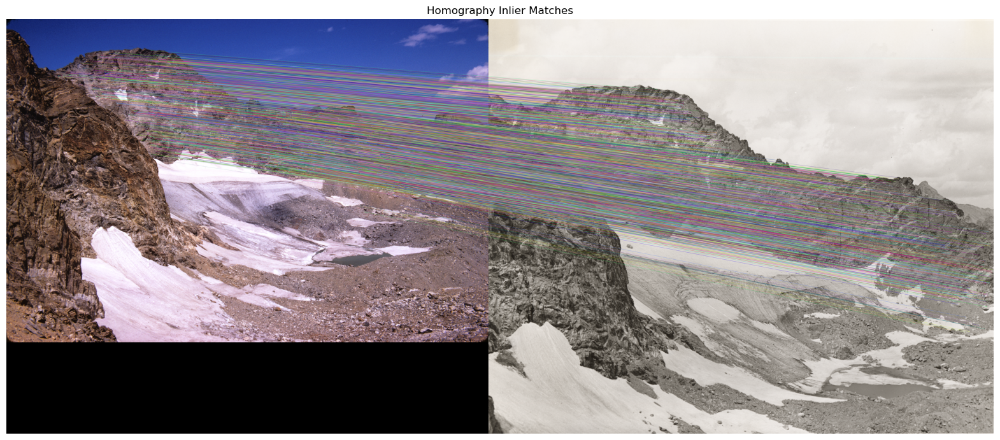

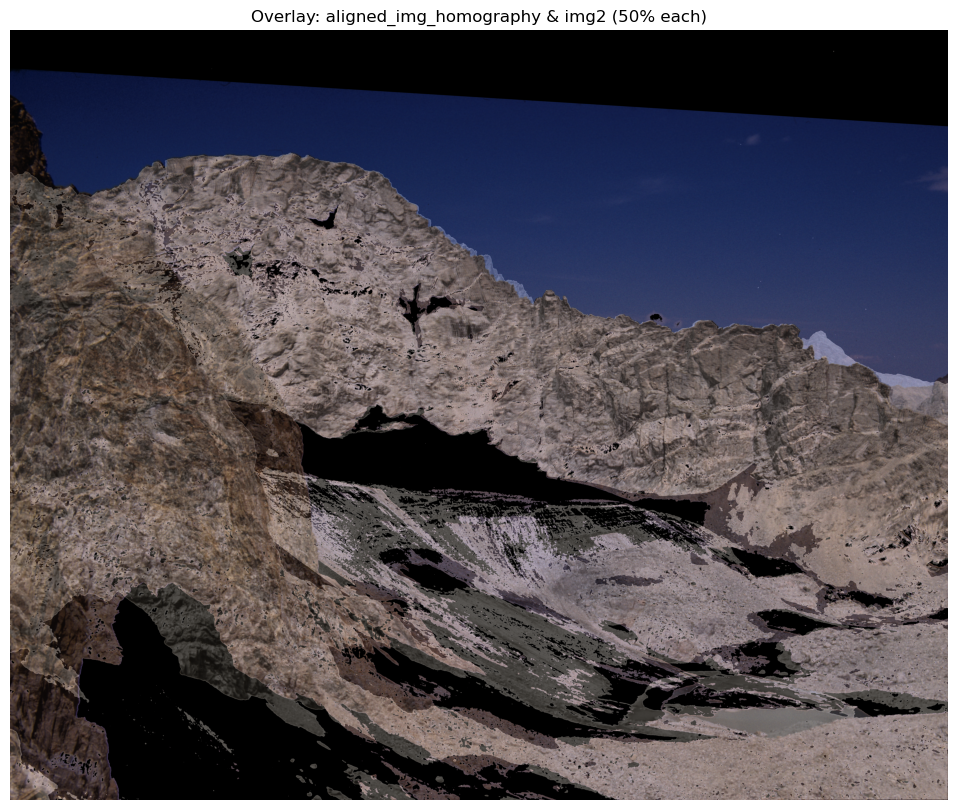

SSIM: 0.2763064147837886


In [14]:
# Homography alignment visualization

H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 25.0)
aligned_img_homography = cv2.warpPerspective(snow_masked_image_1, H, (img2.shape[1], img2.shape[0]))

inlier_matches_homography = [good_matches[i] for i in range(len(good_matches)) if mask[i]]

img_inliers_homography = cv2.drawMatches(
    img1, keypoints1,
    img2, keypoints2,
    inlier_matches_homography, None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(img_inliers_homography, cv2.COLOR_BGR2RGB))
plt.title('Homography Inlier Matches')
plt.axis('off')
plt.show()

# Overlay aligned_img_homography and img2 with 50% opacity each
overlay = cv2.addWeighted(aligned_img_homography, 0.5, snow_masked_image_2, 0.5, 0)
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.title('Overlay: aligned_img_homography & img2 (50% each)')
plt.axis('off')
plt.show()

grayA = cv2.cvtColor(aligned_img_homography, cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
score, _ = ssim(grayA, grayB, full=True)
print("SSIM:", score)


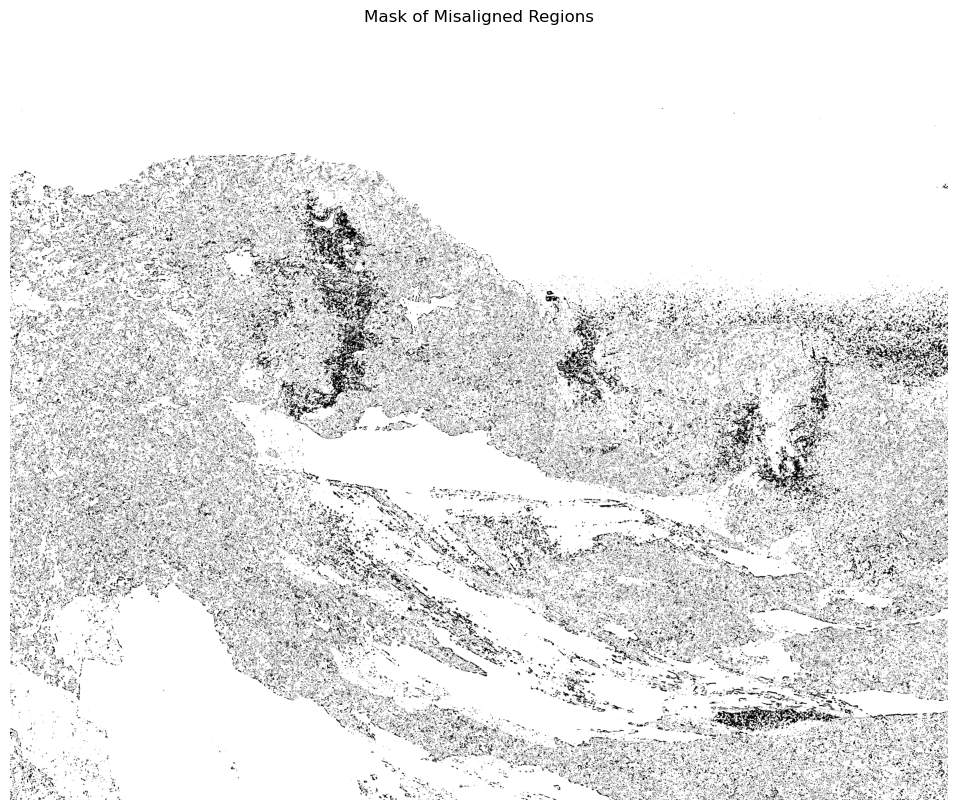

In [15]:
from skimage.metrics import structural_similarity as ssim
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Convert images to grayscale if not already
grayA = cv2.cvtColor(aligned_img_homography, cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Compute SSIM map
score, diff = ssim(grayA, grayB, full=True)
diff = (diff * 255).astype("uint8")

# Threshold the SSIM map to get mask of misaligned regions
# Lower SSIM values indicate more difference
_, mask = cv2.threshold(diff, 200, 255, cv2.THRESH_BINARY_INV)

plt.figure(figsize=(20, 10))
plt.imshow(mask, cmap='gray')
plt.title('Mask of Misaligned Regions')
plt.axis('off')
plt.show()

In [8]:
import cv2
import numpy as np
try:
    from skimage.feature import greycomatrix, greycoprops
except ImportError:
    try:
        from skimage.feature.texture import greycomatrix, greycoprops
    except ImportError:
        raise ImportError("greycomatrix and greycoprops not found in skimage.feature or skimage.feature.texture")
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Compute GLCM for both images
glcm1 = greycomatrix(gray1, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
glcm2 = greycomatrix(gray2, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)

# Extract texture features
contrast1 = greycoprops(glcm1, 'contrast')[0, 0]
contrast2 = greycoprops(glcm2, 'contrast')[0, 0]
energy1 = greycoprops(glcm1, 'energy')[0, 0]
energy2 = greycoprops(glcm2, 'energy')[0, 0]

print("Image 1 - Contrast:", contrast1, "Energy:", energy1)
print("Image 2 - Contrast:", contrast2, "Energy:", energy2)

ImportError: greycomatrix and greycoprops not found in skimage.feature or skimage.feature.texture